# Ejercicios de clase

## Configurar el repositorio de github, conda y jupyter lab.

Se crea un repositorio llamado Tarea4 y se clona usando <git clone git clone https://github.com/AGonzalezLoro/Tarea4.git>

Dentro del repositorio clonado se crea el entorno de conda con <conda create --prefix ./Tarea4> y <conda config --append envs_dirs .>.

Creamos el fichero .gitignore y añadimos la carpeta del entorno.
    
Actualizamos el repositorio de github (add, commit y push).

Activamos el entorno de conda con <conda activate Tarea4>.
    
Instalamos el software necesario:
    <python3 -m ipykernel install --user --name=Tarea4>
    <conda install -c conda-forge jupyterlab>
    
Por ultimo ejecutamos jupyter-lab y creamos el notebook.


## Cargar un audio estéreo de entre los facilitados y mostrar sus características: frecuencia de muestreo, número de canales y tamaño del archivo.


In [1]:
# Importacion.
from scipy.io import wavfile
import IPython
import os
import numpy as np
import matplotlib.pyplot as plt

# Directorios que usaremos.
cwd = os.getcwd()
audio_input_path = os.path.join(cwd, os.path.join('audio'))  # audio_examples
audio_output_path = os.path.join(cwd, os.path.join('audio', '_output'))
print(f'Path to input audio: {audio_input_path}')
print(f'Path to output audio: {audio_output_path}\n')

# Cargamos el archivo de audio.
filename = os.path.join(audio_input_path, 'the_last_of_us_reduced.wav')
sample_rate, audio_data = wavfile.read(filename)
print(f'Frecuencia de muestreo (sample rate): {sample_rate/1000} kHz')

# Mostrar informacion (sonido estéreo).
print('Datos de audio (estereo):')
print(f'- Tamaño:     {audio_data.shape}')
print(f'- Frecuendia de muestreo:   {sample_rate}')
print('- Numero de canales: 2 (stereo)\n')

Path to input audio: /home/adrian/Documents/SM/Tarea4.2/Tarea4/Tarea4/audio
Path to output audio: /home/adrian/Documents/SM/Tarea4.2/Tarea4/Tarea4/audio/_output

Frecuencia de muestreo (sample rate): 44.1 kHz
Datos de audio (estereo):
- Tamaño:     (1420427, 2)
- Frecuendia de muestreo:   44100
- Numero de canales: 2 (stereo)



## Incluir un widget para reproducir el audio estéreo.


In [2]:
IPython.display.Audio(audio_data.T, rate=sample_rate)

## Convertir el archivo de audio estéreo a mono y mostrar las características anteriormente mencionadas.


In [3]:
new_data_mono = audio_data.mean(axis=1)  # Column-wise.
print('Nuevos datos de audio (mono):')
print(f'-Tamaño: {new_data_mono.shape}')
print(f'- Frecuendia de muestreo:   {sample_rate}')
print('- Numero de canales: 1 (mono)\n')

Nuevos datos de audio (mono):
-Tamaño: (1420427,)
- Frecuendia de muestreo:   44100
- Numero de canales: 1 (mono)



## Incluir un nuevo widget para reproducir el audio mono.

In [4]:
IPython.display.Audio(new_data_mono, rate=sample_rate)

## Mostrar la gráfica en el dominio del tiempo.

Señal mono en el dominio del tiempo:

Número de muestras del archivo (valores de amplitud): 1420427


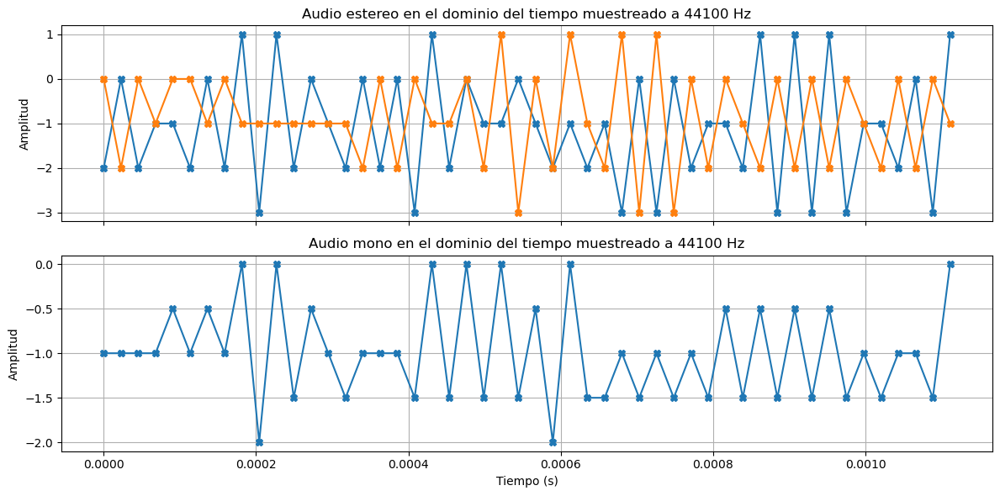

In [5]:
ampl_values_stereo = len(audio_data)
ampl_values_mono = len(new_data_mono)
print(f'Número de muestras del archivo (valores de amplitud): {ampl_values_mono}')

# Valor inicial: 0
# Valor final: muestras/frecuencia de muestreo
# Incremento: 1/frecuencia de muestreo
t1 = np.arange(0, ampl_values_stereo/sample_rate, 1/sample_rate)
t2 = np.arange(0, ampl_values_mono/sample_rate, 1/sample_rate)

fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
end = 50


# Señal estereo.
ax[0].plot(t1[:end], audio_data[:end], marker='X')
ax[0].set_title(f'Audio estereo en el dominio del tiempo muestreado a {sample_rate} Hz')
ax[0].set_ylabel('Amplitud')
ax[0].grid(True)


# Señal mono.
ax[1].plot(t2[:end], new_data_mono[:end], marker='X')
ax[1].set_title(f'Audio mono en el dominio del tiempo muestreado a {sample_rate} Hz')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Amplitud')
ax[1].grid(True)

# Mostramos la figura.
plt.tight_layout()
plt.show()

## Explicar con tus palabras las diferencias entre audio estéreo y mono y definir lo que es la frecuencia de muestreo.

El audio estéreo utiliza dos canales independientes, uno para el audio de la izquierda y otro para el de la derecha. El audio mono solo utiliza un canal para todo el audio.


La frecuencia de muestreo define la cantidad de veces por segundo que se va a tomar muestras de la señal a la hora de transformar la señal analogica a digital. A mayor frecuencia de muestreo, mayor calidad de la señal resultante pero mayor memoria requerida, tanto para su transformacion a digital como para almacenar la señal resultante.

Por lo general se utiliza una frecuencia de muestreo del orden de varios kHz.


## Aplicar la Transformada rápida de Fourier (FFT) para cambiar al dominio de la frecuencia. Mostrar la gráfica y explicar el por qué hacemos esto.


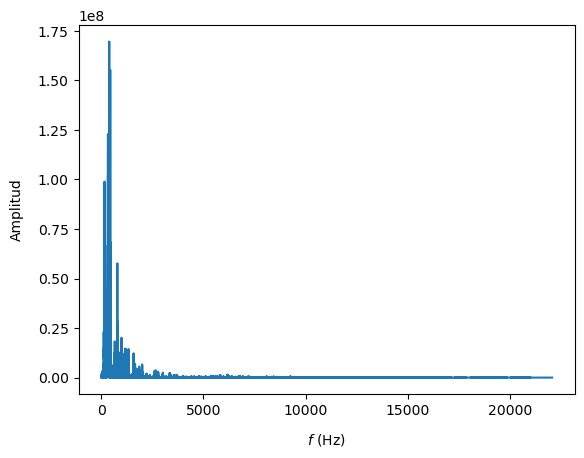

In [6]:
# La longitud del array de datos y el
# sample rate (frecuencia de muestreo).
n = len(new_data_mono)
Fs = sample_rate

# Working with stereo audio, there are two channels in the audio data.
# Let's retrieve each channel seperately:
# ch1 = np.array([data[i][0] for i in range(n)]) #channel 1
# ch2 = np.array([data[i][1] for i in range(n)]) #channel 2
# We can then perform a Fourier analysis on the first
# channel to see what the spectrum looks like.

# Calculando la Transformada Rapida de Fourier (FFT) en audio mono.
ch_Fourier = np.fft.fft(new_data_mono)  # ch1

# Solo miramos frecuencia por debajo de Fs/2
# (Nyquist-Shannon) --> Spectrum.
abs_ch_Fourier = np.absolute(ch_Fourier[:n//2])

# Graficamos.
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Amplitud', labelpad=10)
plt.xlabel('$f$ (Hz)', labelpad=10)
plt.show()

La transformada rapida de fourier, sirve para descomponer la señal en sus diferentes componentes espectrales y obtener información sobre su composición. Esto tiene varias utilidades, como por ejemplo, analizar las frecuencias predominantes en la señal para seleccionar una frecuencia de corte.


## Calcular la energía del espectrograma y la frecuencia de corte eligiendo un epsilon.



Epsilon: 0.025
Valor de corte para la energia del espectro: 166281873472.64792
Mascara: [False False False ...  True  True  True]
Frecuencia de corte f0 (Hz): 11358


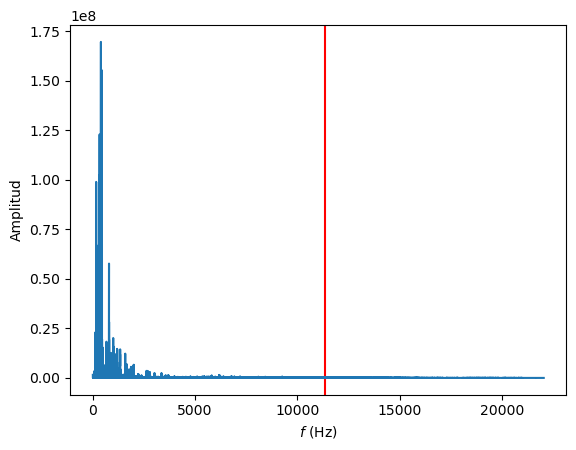

In [7]:
# Definimos epsilon: la parte de la energia
# del espectro que no conservamos.
eps = [.01, .02, .025, .0125, .075, .125, .05]

# Jugamos con los valores de epsilon
eps = eps[2]  # Cambiar.
print(f'Epsilon: {eps}')

# Calculamos el valor de corte para esta energia.
thr_spec_energy = (1 - eps) * np.sum(abs_ch_Fourier)
print(f'Valor de corte para la energia del espectro: {thr_spec_energy}')

# Integral de la frecuencia --> energia del espectro.
spec_energy = np.cumsum(abs_ch_Fourier)

# Mascara (array booleano) que compara el valor
# de corte con la energia del espectro.
frequencies_to_remove = thr_spec_energy < spec_energy  
print(f'Mascara: {frequencies_to_remove}')

# La frecuencia f0 por la que cortamos el espectro.
f0 = (len(frequencies_to_remove) - np.sum(frequencies_to_remove)) * (Fs/2) / (n//2)
print(f'Frecuencia de corte f0 (Hz): {int(f0)}')

# Graficamos.
plt.axvline(f0, color='r')
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Amplitud')
plt.xlabel('$f$ (Hz)')
plt.show()

## Comprimir la onda aplicando downsampling, donde el factor de downsampling se obtiene a partir de la frecuencia de corte anteriormente calculada.


In [8]:
# Definimos los nombres de los audios comprimidos.
wav_compressed_file = "sample_48kHz_compressed.wav"

# Calculamos el factor D de downsampling.
D = int(Fs / f0)
print(f'Factor de downsampling: {D}')

# Obtenemos los nuevos datos (slicing with stride).
new_data = new_data_mono[::D]

# Escribimos los datos a un archivo de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, wav_compressed_file),
    rate=int(Fs/D),
    data=new_data
)

# Cargamos el nuevo archivo.
new_sample_rate, new_audio_data = wavfile.read(filename=os.path.join(audio_output_path, wav_compressed_file))

Factor de downsampling: 3


## Mostrar el espectograma de ambas ondas: original y comprimida. Explicar las diferencias.


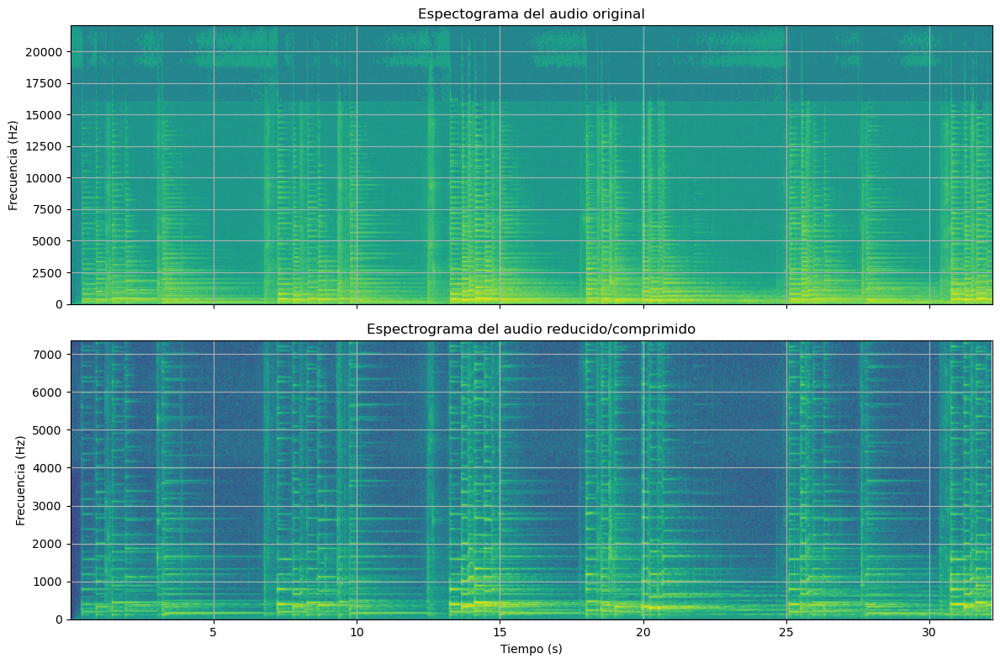

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

Pxx, freqs, bins, im = ax[0].specgram(new_data_mono, NFFT=1024, Fs=sample_rate, noverlap=512)
ax[0].set_title('Espectograma del audio original')
ax[0].set_ylabel('Frecuencia (Hz)')
ax[0].grid(True)

Pxx, freqs, bins, im = ax[1].specgram(new_audio_data, NFFT=1024, Fs=new_sample_rate, noverlap=512)
ax[1].set_title('Espectrograma del audio reducido/comprimido')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Frecuencia (Hz)')
ax[1].grid(True)

plt.tight_layout()
plt.show()

Como se puede comprobar, la estructura del espectrograma es similar, pero se puede notar que la señal comprimida tiene un espectrograma mas difuso. Ademas la señal comprimida ve reducida su frecuencia.

El tamaño de los archivos es:


In [ ]:
print(f'-Tamaño señal original: {new_data_mono.shape}')
print(f'-Tamaño señal comprimida: {new_audio_data.shape}')


-Tamaño señal original: (1420427,)
-Tamaño señal comprimida: (473476,)


## Colocar también dos widgets para reproducir los audios.

Audio de la señal original:

In [ ]:
IPython.display.Audio(new_data_mono, rate=sample_rate)


Audio de la señal comprimida:

In [ ]:
IPython.display.Audio(new_audio_data, rate=new_sample_rate)